In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yaml

config = yaml.load(open('../config/full_images_to_hist_config.yaml', 'r'), Loader=yaml.FullLoader)
n_bins = config['clusterization_config']['n_clusters']

In [2]:
df = pd.read_csv('../dataset/total_quant_histogram.csv')
df

,image_name,histogram
0,0_618577ba46bc3d04.jpg,[0.0040186 0.00703256 0. 0.00803721 0...
1,0_8684223b404f7e47.jpg,[0.0040186 0.00904186 0.01707907 0.0020093 0...
2,0_8c54ccf63a12ee74.jpg,[0.00403738 0. 0.00605607 0.00403738 0...
3,0_b904d301c9f168df.jpg,[0.01306047 0.00502326 0.01205581 0.00803721 0...
4,0_c8f198d7da690cc8.jpg,[0.00801317 0.00200329 0.00100165 0.00701152 0...
...,...,...
8765,9_2880a8b6f793718b.jpg,[0.01406512 0.00703256 0.0040186 0.00803721 0...
8766,9_4ba6081e04732c14.jpg,[0.01105116 0.00803721 0.00602791 0.00502326 0...
8767,9_4ff64580c942c4d3.jpg,[0.00803721 0.0020093 0.00100465 0.00301395 0...
8768,9_ae96695dd68be0b5.jpg,[0.00501824 0.00301094 0.00100365 0.00702553 0...


In [3]:
def get_hist(value):
    hist = str(value).strip().replace('[','').replace(']','').replace("\n","").split(" ")
    hist = [i for i in hist if i != '']
    hist = np.array(hist, dtype=np.float32)
    return hist

In [4]:
def plot_histogram(df, index):
    hist = get_hist(df["histogram"][index])
    x = np.arange(0, n_bins)
    plt.bar(x, hist)
    plt.title("Histogram")
    plt.xlabel("Quantized Value")
    plt.ylabel("Frequency")
    plt.show()


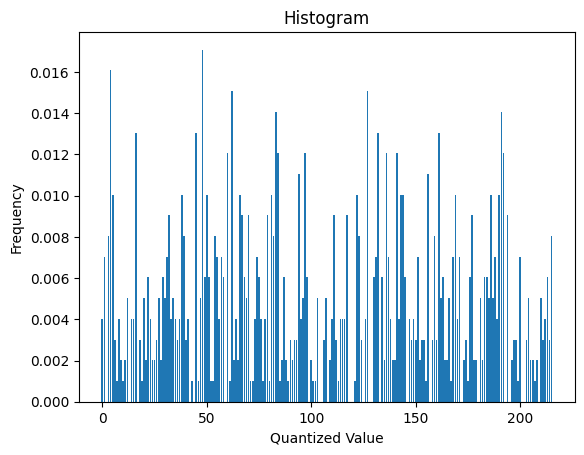

In [5]:
plot_histogram(df, 0)

In [6]:
def similarity_metric(vec_1,vec_2, measure = 'euclidean'):
    if measure == 'euclidean':
        resta = vec_1 - vec_2
        return np.sqrt(np.sum(resta**2))
    elif measure == 'manhattan':
        resta = vec_1 - vec_2
        return np.sum(np.abs(resta))
    elif measure == 'cosine':
        dot_product = np.dot(vec_1, vec_2)
        norm_a = np.linalg.norm(vec_1)
        norm_b = np.linalg.norm(vec_2)
        cosine_similarity = dot_product / (norm_a * norm_b)
        return 1 - cosine_similarity
    else:
        raise ValueError(f"Unknown measure: {measure}")

In [7]:
# import module from other directory
import sys
sys.path.insert(1, '../')

from src.SIFT.SIFT_gen_and_utils import SIFTFeatures

SIFT = SIFTFeatures("", "", run=False)
image_example = df["image_name"][999]
image_class = SIFT.get_class(image_example)
image_class

'1111_type1'

In [8]:
# get all images from the same class
df["class"] = df["image_name"].apply(lambda x: SIFT.get_class(x))

df["features"] = df["histogram"].apply(lambda x: get_hist(x))


In [9]:
def query_image(df, image_name, measure="euclidean"):
    df["similarity"] = df["features"].apply(lambda x: similarity_metric(x, df[df["image_name"] == image_name]["features"].values[0], measure=measure))
    df = df.sort_values(by=['similarity'])
    df = df.reset_index(drop=True)
    return df

In [10]:
image_example = df["image_name"][0]
df_query = query_image(df, image_example, measure="euclidean")
df_query

,image_name,histogram,class,features,similarity
0,0_618577ba46bc3d04.jpg,[0.0040186 0.00703256 0. 0.00803721 0...,0_type1,"[0.0040186, 0.00703256, 0.0, 0.00803721, 0.016...",0.000000
1,271_831e55be48c997e75f8c3017a2e656a2.jpg,[0.00803721 0.00502326 0.0040186 0.00803721 0...,271_type1,"[0.00803721, 0.00502326, 0.0040186, 0.00803721...",0.048682
2,303_eb4b51a0e5b9cdc67f996cb82a3e7a1f.jpg,[0.01105116 0.01707907 0.0040186 0.00100465 0...,303_type1,"[0.01105116, 0.01707907, 0.0040186, 0.00100465...",0.049707
3,223_852493e47ec68af44ace8a138476a183.jpg,[0.01004651 0.0020093 0.00100465 0.01306047 0...,223_type1,"[0.01004651, 0.0020093, 0.00100465, 0.01306047...",0.050112
4,238_59690349616fbfd30d5bd82e34fac4a5.jpg,[0.00401459 0.00401459 0.00100365 0.00602189 0...,238_type1,"[0.00401459, 0.00401459, 0.00100365, 0.0060218...",0.050920
...,...,...,...,...,...
8765,567_sketch_6.JPEG,[0.00108543 0. 0. 0. 0...,567_type1,"[0.00108543, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",0.765585
8766,836_121618504240_6.JPG,[0.40754717 0. 0. 0. 0...,836_type1,"[0.40754718, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",0.898892
8767,611_096.jpg,[0.00110548 0. 0. 0. 0...,611_type1,"[0.00110548, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1.077377
8768,127403.jpg,[0.21343874 0. 0. 0. 0...,274_type2,"[0.21343873, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1.746244


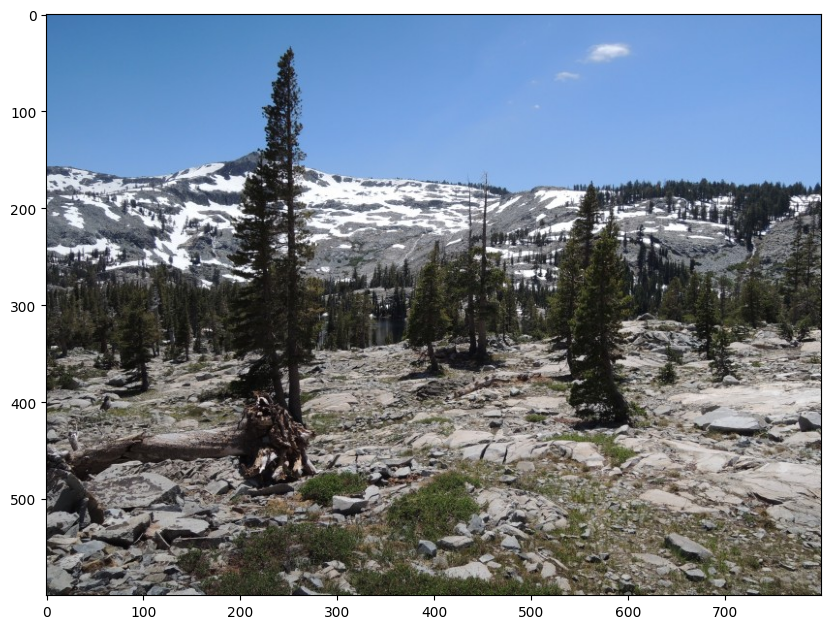

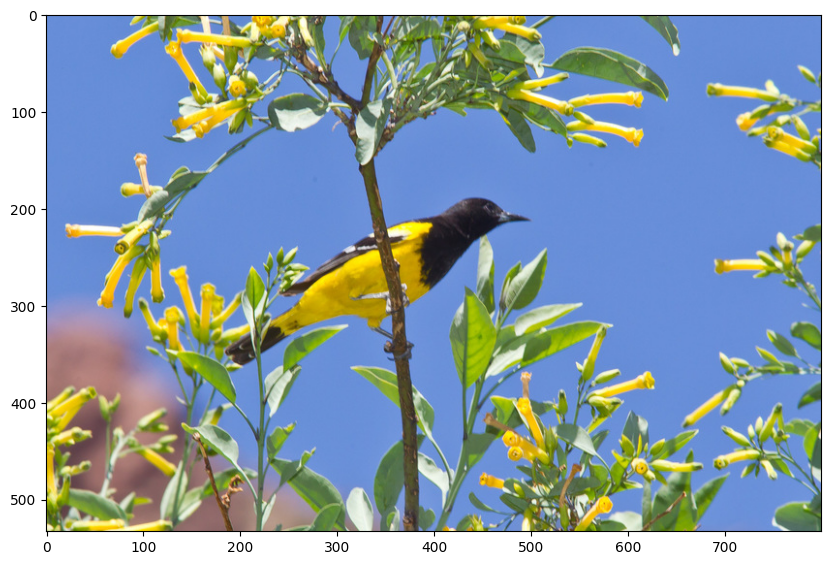

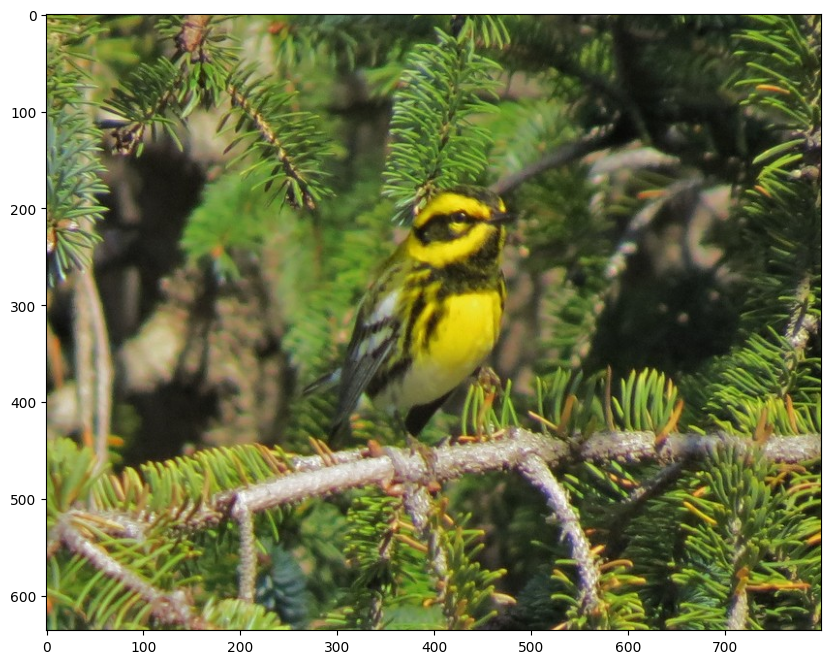

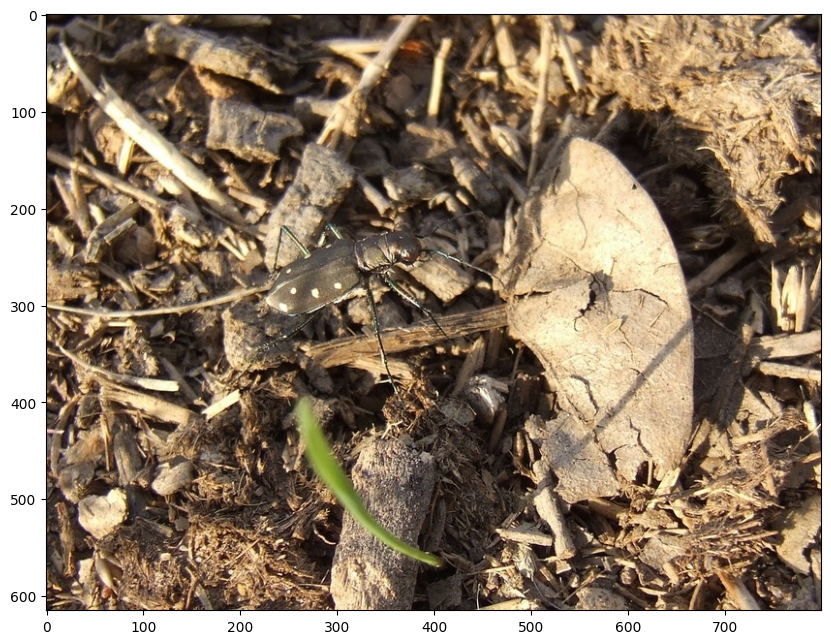

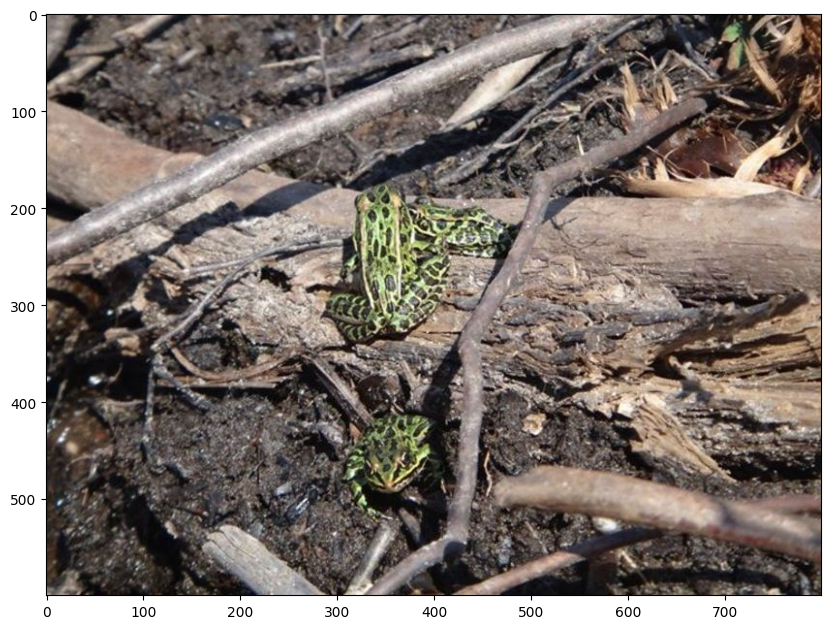

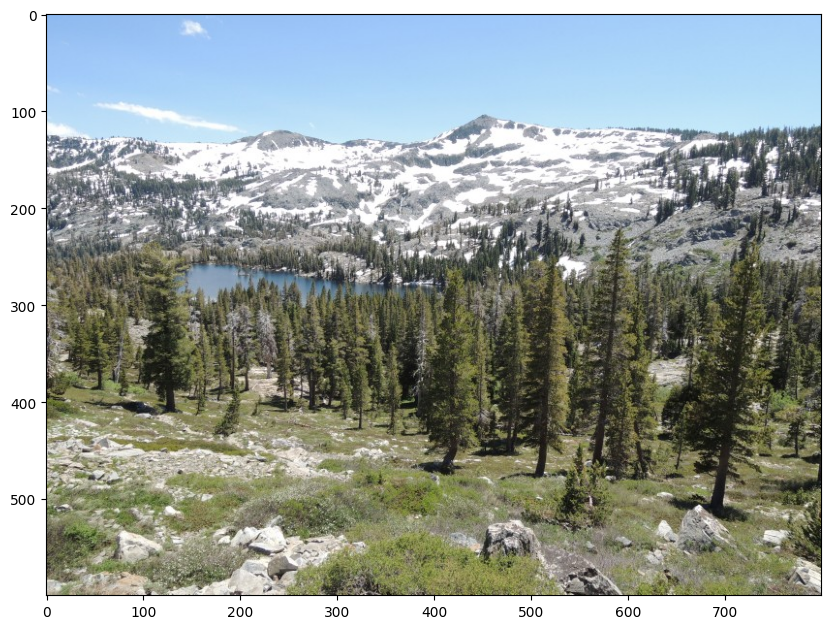

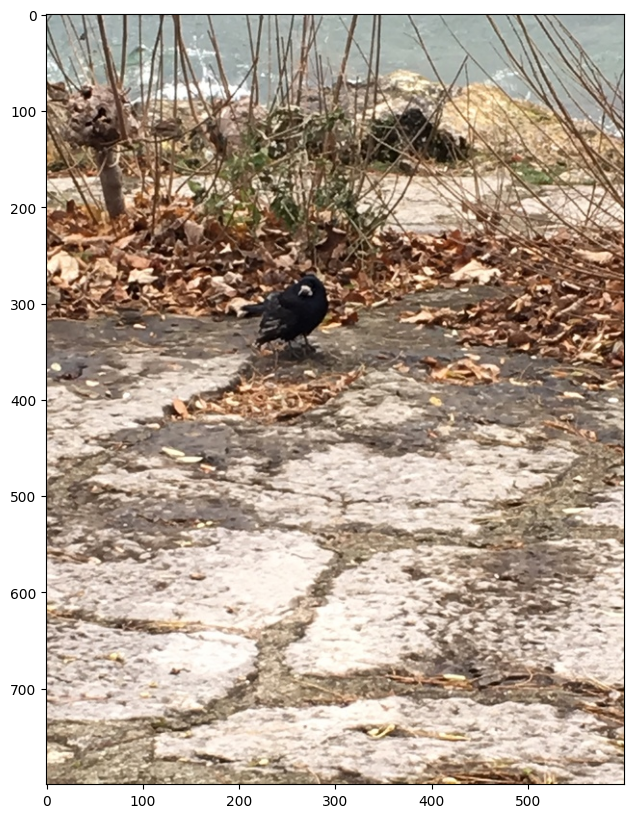

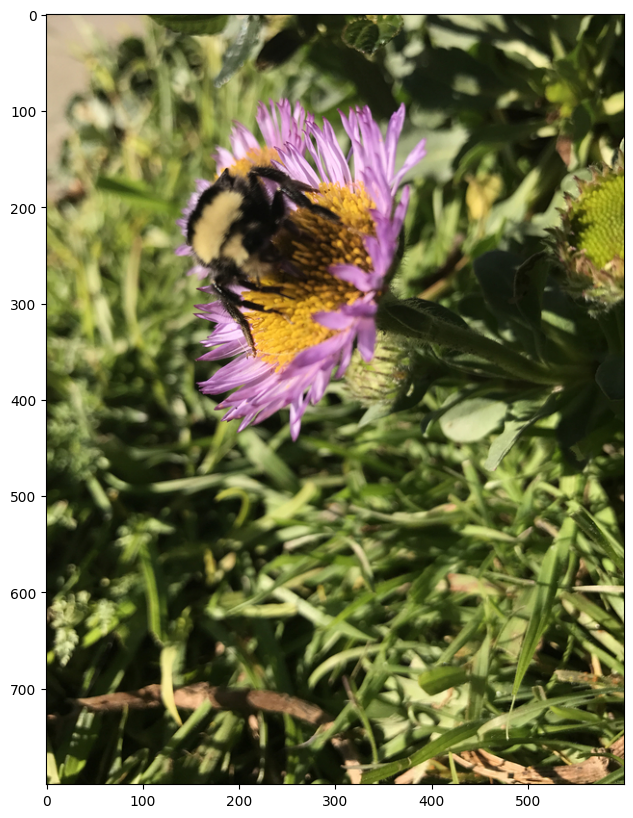

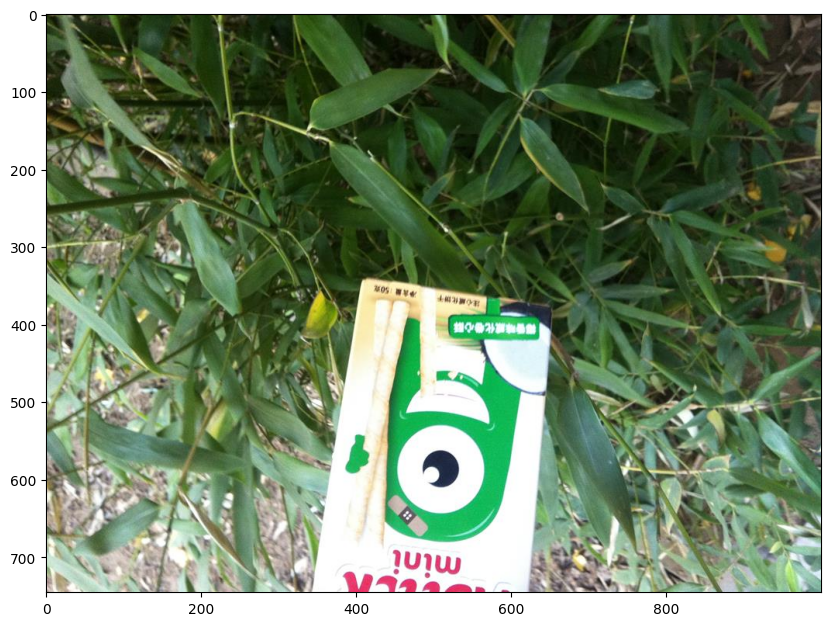

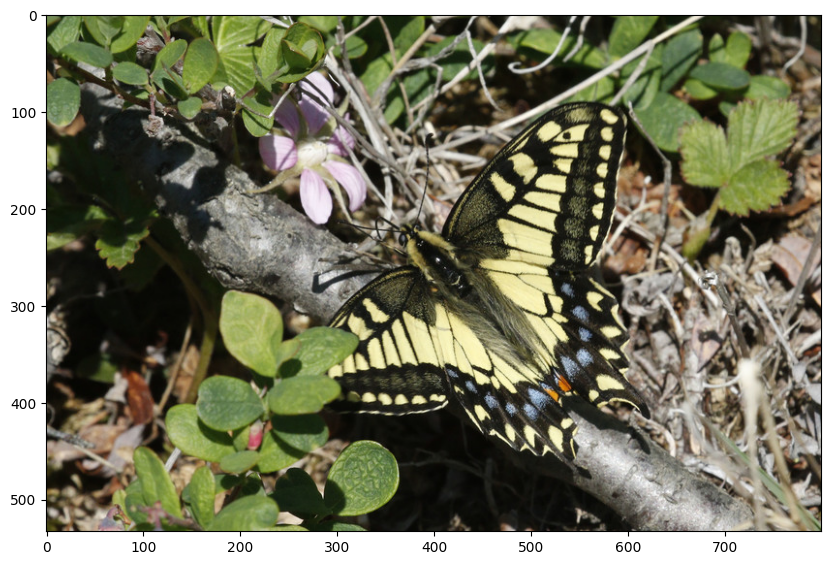

In [11]:
# plot the most similar images
from PIL import Image
def plot_images(df_, index):
    plt.figure(figsize=(10, 10))
    plt.imshow(Image.open(f'../dataset/total/{df_["image_name"][index]}'))
    plt.show()


for i in range(0, 10):
    #print(df["similarity"][i])
    #print(df["image_name"][i])
    plot_images(df_query, i)


In [12]:
# count how many different classes are
df["class"].nunique()

1700

In [26]:
# evaluating ranking method
def evaluate_query(df, image_query, measure="cosine", normalized=True):
    # obtener la clase de la imagen
    image_class = SIFT.get_class(image_query)
    # calcular similudes
    df = query_image(df, image_query, measure=measure)
    # obtener los indices de las imagenes de la misma clase
    indexes = df[df["class"] == image_class].index.values.tolist()
    n_rel = len(indexes)

    if normalized:
        N = len(df)
        return 1/(n_rel*N) * (sum(indexes) - (n_rel*(n_rel+1))/2)

    return 1/n_rel * sum(indexes)

image_example = df["image_name"][10]
evaluate_query(df, image_example, measure="euclidean", normalized=True)


0.4799967421404138